In [3]:
import numpy as np
import random
import pygame
import matplotlib.pyplot as plt
from IPython.display import clear_output
from scipy import stats
import subprocess

pygame 2.0.1 (SDL 2.0.14, Python 3.8.3)
Hello from the pygame community. https://www.pygame.org/contribute.html


In [135]:
walks = [(-1,-1) , (-1,0) , (-1,1), 
         (0,-1) , (0,0) , (0,1),
         (1,-1), (1,0), (1,1)]


class LDA_PARAMETERS:
    def __init__(self, x_len=540, y_len=480, anode_shape = np.zeros((540, 480)), generation_point_check = 2, starting_point = [0,0], step_distribution = False, epsilon_laplace = 1e-2, eta_prob = 1, pre_solution_potential = None, pre_matrix_dendrite = None,calculate_fd = 0,  verTrayectoria=False, voltage = 10, max_iter = 1_000, force_stop_len = 200):
        """
        generation_point_check: 1 - random de 4 direccioens (bias por el tamaño), 2 - solo salen de starting point, 3 - genera random punto en el mapa
        """
        self.size = self.width, self.height = x_len, y_len
        self.generation_point_check = generation_point_check
        self.starting_point = starting_point
        self.epsilon_laplace = epsilon_laplace
        self.verTrayectoria = verTrayectoria
        self.eta_prob = eta_prob 
        self.calculate_fd = calculate_fd
        self.voltage = voltage
        self.fractal_dims = []
        self.max_iter = max_iter
        self.force_stop_len = force_stop_len
        self.ims_gifs = []
        
        if pre_matrix_dendrite is None:
            self.matrixDendrite = np.zeros_like(anode_shape)
            self.matrixDendrite[anode_shape==1]=1
        else:
            self.matrixDendrite = pre_matrix_dendrite
        
        self.cathode = np.zeros_like(anode_shape)
        self.cathode[anode_shape==2]=1
        
        self.iteration = 0
                
                
        assert anode_shape.shape[0]==x_len and anode_shape.shape[1]==y_len, "Wrong anode shape"
        
        self.anode_shape = anode_shape        
        
        if pre_solution_potential is None:
            self.potential = (self.voltage/2)*np.ones_like(anode_shape)
            self.potential[self.cathode==1] = self.voltage
            self.potential[self.matrixDendrite==1] = 0

        else:
            self.potential = pre_solution_potential
            self.potential[self.cathode==1] = self.voltage
            self.potential[self.matrixDendrite==1] = 0

        self.solve_laplace()
        
        
        if starting_point == [0,0]:
            self.X, self.Y = round(self.width/2), round(self.height/2)
        else:
            self.X, self.Y = starting_point
            
        self.step_distribution  = step_distribution
            
        
        self.minX = 0
        self.minY = 0
        self.maxX = self.width-1
        self.maxY = self.height-1
        
        pp1 = True
        pp2 = True
        for i in range(0, self.width):
            if (not any(self.matrixDendrite[i,:])) and pp1:
                self.minX = i
            if any(self.matrixDendrite[i,:]):
                pp1= False
            
            if (not any(self.matrixDendrite[-i,:])) and pp2:
                self.maxX = self.width-i
            if any(self.matrixDendrite[-i,:]):
                pp2= False  
                
        pp1 = True
        pp2 = True
        for i in range(0, self.height):
            if (not any(self.matrixDendrite[:,i])) and pp1:
                self.minY = i
            if any(self.matrixDendrite[:,i]):
                pp1= False        
                
            if (not any(self.matrixDendrite[:,-i])) and pp2:
                self.maxY = self.height-i
            if any(self.matrixDendrite[:,-i]):
                pp2= False      
                
        self.padSize = 20
        self.domainMinX = max([self.minX - self.padSize,1])
        self.domainMaxX = min([self.maxX + self.padSize, self.width - 1])
        self.domainMinY = max([self.minY - self.padSize,1])
        self.domainMaxY = min([self.maxY + self.padSize, self.height - 1])
        
        self.crystalColour = 0xFFFFFF
        
        self.displaySurface = None
        self.pixelArray = None
        self.updateFlag = False
        
    
    def solve_laplace(self):
        
        
        boundary = self.cathode + self.matrixDendrite
        
        potentialFix = np.zeros_like(self.anode_shape)
        potentialFix[self.cathode==1] = self.voltage
        potentialFix[self.matrixDendrite==1] = 0
        
        new_potential = self.potential
        xlen = self.width
        ylen = self.height
        error_satisfied = False
        jj = 0
        while not error_satisfied:
            dummyArray = np.zeros((xlen+2, ylen+2))
            dummyArray[1:-1,1:-1] = new_potential
            dummyArray[0,1:-1] = new_potential[0,:]
            dummyArray[-1, 1:-1] = new_potential[-1,:]
            dummyArray[1:-1,0] = new_potential[:,0]
            dummyArray[1:-1, -1] = new_potential[:,-1]
            
            new_potential2 = 0.25*(dummyArray[2:, 1:-1] + dummyArray[0:-2, 1:-1]+ dummyArray[1:-1, 2:] + dummyArray[1:-1, 0:-2])
            new_potential2 = np.where(boundary, potentialFix, new_potential2)
            substr=new_potential-new_potential2
            error1=np.sum(np.abs(substr))
            if error1<=self.epsilon_laplace:
                error_satisfied = True
            else:
                new_potential = new_potential2
            
            jj+=1
            if jj%50==0:
                clear_output(wait=True)
                print('Solving laplace equation...' , '\nIteration: ', jj, ' - Error: ',  error1)

        
        self.potential = new_potential
        

    def exporting_to_mathematica(self):
        maskedDendrite= np.zeros_like(self.matrixDendrite)
        matrixDend= self.matrixDendrite/np.max(self.matrixDendrite)
        matrixDend = matrixDend.astype(int) - self.anode_shape.astype(int)
        maskedDendrite[matrixDend>0]=1
        return maskedDendrite

    def saving_to_mathematica(self, maskedDendr, name='trial'):
        
        maskedDendr = maskedDendr.flatten()
        maskedDendr.astype('float32').tofile(f'{name}.dat')  
    
    
    def fractal_dimension(self):
        dim = 0
        try:
        #SOLO SIRVE PARA X_LEN= 120 = Y_LEN
            #maskedDendrite = self.exporting_to_mathematica()
            maskedDendrite = self.matrixDendrite/np.max(self.matrixDendrite)
            self.saving_to_mathematica(maskedDendrite)
            subprocess.call(["WolframScript", "-run", "fracDim_llamar_python.m"])
            f = open("fractal_dim_value.txt", "r")
            dim = f.read()
            dim = float(dim)
            f.close()
        
        except:
            self.isRunning = False
        
        return dim
    
    def probs_walk(self):
        posx = self.X
        posy = self.Y
        if posx!=0 and posx!=self.width-1 and posy!=0 and posy!=self.height-1:
            ##?????
            radi = self.potential[self.X-1:self.X+2,self.Y-1:self.Y+2]
            electric_field = radi - self.potential[self.X, self.Y]*np.ones_like(radi)
            electric_field[0,0] /= np.sqrt(2)
            electric_field[0,2] /= np.sqrt(2)
            electric_field[2,0] /= np.sqrt(2)
            electric_field[2,2] /= np.sqrt(2)
            electric_field = np.exp(-self.eta_prob*electric_field)
            electric_field[1,1]=0
            prob = electric_field/np.sum(electric_field)
            probs_to_walk = prob.flatten()

        else:
            probs_to_walk = np.ones(9)/9
        return probs_to_walk
    
    
    
    def langevin_eq_electric(self):
        posx = self.X
        posy = self.Y
        
        ddx, ddy = np.gradient(self.potential)
        
        if ddx[posx]>0.5:
            dx = 1
        elif ddx[pox]<-0.5:
            pass
        
        
    
    def on_init(self):
        pygame.init()
        pygame.display.set_caption("IPT Dendrites")
        self.displaySurface = pygame.display.set_mode(self.size)
        self.pixelArray = pygame.PixelArray(self.displaySurface)
        self.isRunning = True
        
        for i in range(0,self.width):
            for j in range(0, self.height):
                if self.matrixDendrite[i,j]==1:
                    self.pixelArray[i,j]=self.crystalColour
                
                if self.cathode[i,j]==1:
                    self.pixelArray[i,j]=0x7FFFFF
        
        pygame.display.update()
        
    def on_event(self, event):
        if event.type == pygame.QUIT:
            self.isRunning = False
            
#         if event.type == pygame.VIDEORESIZE:
#             self.displaySurface = pygame.display.set_mode((event.w, event.h),
#                                               pygame.RESIZABLE)
    

    
    def on_loop(self):
        
        if len(self.fractal_dims)>= self.force_stop_len:
            self.isRunning = False
        
        if self.step_distribution == False:
            newDir = random.choice(walks)
            dX, dY = newDir
        
        elif self.step_distribution == True:
            newDir = walks[np.random.choice(len(walks), p=self.probs_walk())]
            dX, dY = newDir
            
        newX, newY = self.X+dX, self.Y+dY
        pasoAlLado = False
        if (newX<self.domainMinX):
            newX = self.domainMaxX  
            pasoAlLado = True
        if (newX > self.domainMaxX):
            newX = self.domainMinX  
            pasoAlLado = True
        if(newY<self.domainMinY):
            newY = self.domainMaxY 
            pasoAlLado = True
        if(newY > self.domainMaxY):
            newY = self.domainMinY
            pasoAlLado = True

            
        if (self.pixelArray[newX, newY]) == self.crystalColour:
            self.updateFlag = True
            
            if pasoAlLado == True:
                self.updateFlag = False
                self.X , self.Y = newX, newY
            
            if (self.X < self.minX):
                self.minX = self.X
                
            if (self.X > self.maxX):
                self.maxX = self.X
            
            if (self.Y < self.minY):
                self.minY = self.Y
                
            if (self.Y > self.maxY):
                self.maxY = self.Y
            
            self.domainMinX = max([self.minX - self.padSize,1])
            self.domainMaxX = min([self.maxX + self.padSize, self.width - 1])
            self.domainMinY = max([self.minY - self.padSize,1])
            self.domainMaxY = min([self.maxY + self.padSize, self.height - 1])
                
            
        else:
            self.updateFlag = False
            self.X , self.Y = newX, newY
            
            
            if self.verTrayectoria == True:
                self.pixelArray[newX, newY] = 0x7FFFFF
                pygame.display.update()   
                
            if self.max_iter < self.iteration:
                self.isRunning = False
      
    def gen_random_spot(self):
        
        # Creo que esto genera un bias para que las dendritas se formen hacia los lados
#         x = np.random.randint(self.domainMinX, self.domainMaxX)
#         y = np.random.randint(self.domainMinY, self.domainMaxY)

        x = np.random.randint(0, self.width)
        y = np.random.randint(0, self.height)

        if self.matrixDendrite[x,y]==1:
            x,y = self.gen_random_spot()
        
        return x,y
    
    def on_render(self):
        
        if self.updateFlag:
            
            self.pixelArray[self.X, self.Y] = self.crystalColour
            self.matrixDendrite[self.X, self.Y] = 1
            self.potential[self.X, self.Y] = self.voltage
            self.iteration += 1
            pygame.display.update()
            self.updateFlag = False
            
            if self.iteration%5:
                self.solve_laplace()  
                self.ims_gifs.append(np.copy(self.matrixDendrite))
            
            if self.calculate_fd > 0 and self.iteration%self.calculate_fd and self.iteration>200:
                self.fractal_dims.append(self.fractal_dimension())
                
            if self.generation_point_check == 1:
                newSide = np.random.choice([1,2,3,4])

                if(newSide == 1):
                    self.X = self.domainMinX
                    self.Y = int(np.random.uniform(self.domainMinY, self.domainMaxY))

                elif(newSide == 2):
                    self.X = int(np.random.uniform(self.domainMinX, self.domainMaxX))
                    self.Y = self.domainMinY

                elif(newSide == 3):
                    self.X = self.domainMaxX
                    self.Y = int(np.random.uniform(self.domainMinY, self.domainMaxY))

                else:
                    self.X = int(np.random.uniform(self.domainMinX, self.domainMaxX))
                    self.Y = self.domainMaxY
            
            elif self.generation_point_check == 2:

                eps = np.random.rand()
                if eps<0.6:
                    self.X, self.Y = self.starting_point
                else:
                    self.X, self.Y = self.gen_random_spot()
                
            elif self.generation_point_check == 3:
                self.X, self.Y = self.gen_random_spot()
            
                 
    def on_execute(self):
        if self.on_init() == False:
            self.isRunning = False
        
        while self.isRunning:
            for event in pygame.event.get():
                self.on_event(event)
                
            self.on_loop()
            self.on_render()
            
        matrix = self.matrixDendrite
        potential = self.potential
        fractal_dims = self.fractal_dims
        gifs = self.ims_gifs
        pygame.quit()
        
        return matrix, potential, fractal_dims, gifs
        


In [142]:
x_len = 120      
y_len = 120    
anode_shape = np.zeros((x_len, y_len))


# a = 5
# b = 60
# r = 5
# x, y = np.ogrid[-a:x_len-a, -b:y_len-b]
# mask = x*x + y*y <= r*r
# anode_shape[mask] = 2

# a = 60
# b = 5
# r = 5
# x, y = np.ogrid[-a:x_len-a, -b:y_len-b]
# mask = x*x + y*y <= r*r
# anode_shape[mask] = 2

# a = 60
# b = 115
# r = 5
# x, y = np.ogrid[-a:x_len-a, -b:y_len-b]
# mask = x*x + y*y <= r*r
# anode_shape[mask] = 2


#LINEA RECTA!!
#anode_shape[440:445,:] = np.ones((5,anode_shape.shape[0]))

#CIRCULO!!
# aA = 400
# bA = 250
# rA = 20
# x, y = np.ogrid[-aA:x_len-aA, -bA:y_len-bA]
# mask = x*x + y*y <= r*r
# anode_shape[mask] = 1


# aA= 110
# bA= 60
# r = 5
# x, y = np.ogrid[-aA:x_len-aA, -bA:y_len-bA]
# mask = x*x + y*y <= r*r
# anode_shape[mask] = 1


ladoTriang = x_len//15 +1
for i in range(1, ladoTriang):
    anode_shape[-2*i:, 60+i] = np.ones(2*i)
    anode_shape[-2*i:, 60+2*ladoTriang-i-1] = np.ones(2*i)

    
    anode_shape[:2*i, 60+i] =2* np.ones(2*i)
    anode_shape[:2*i, 60+2*ladoTriang-i-1] = 2* np.ones(2*i)


# anode_shape[-7:,50:70] = np.ones_like(anode_shape[-7:,50:70])
# anode_shape[:7,50:70] = 2*np.ones_like(anode_shape[:7,50:70])


allMatrixDendriteGIF = []
allPotentialDendriteGIF = []
allFractalDimensionsGIF = []

# for ivolt in np.array([5, 7.5, 10]):
#     if __name__ == "__main__":
#         t = LDA_PARAMETERS(x_len = x_len, y_len = y_len, 
#                            anode_shape = anode_shape, 
#                            starting_point = [2, 60] , 
#                            generation_point_check= 2, 
#                            step_distribution= True,
#                            epsilon_laplace= 1e-2,
#                            eta_prob=5,
#                            pre_matrix_dendrite = None,
#                            pre_solution_potential = None,
#                            verTrayectoria=False,
#                            calculate_fd=200,
#                            force_stop_len = 400,
#                            voltage = ivolt)
#         matrixDendritei, potentialDendritei, frac_dimsi = t.on_execute()
#         allMatrixDendrite3.append(matrixDendritei)
#         allPotentialDendrite3.append(potentialDendritei)
#         allFractalDimensions3.append(frac_dimsi)


if __name__ == "__main__":
    t = LDA_PARAMETERS(x_len = x_len, y_len = y_len, 
                       anode_shape = anode_shape, 
                       starting_point = [a, b] , 
                       generation_point_check= 2, 
                       step_distribution= True,
                       epsilon_laplace= 1e-2,
                       eta_prob=5,
                       pre_matrix_dendrite = None,
                       pre_solution_potential = None,
                       verTrayectoria=False,
                       calculate_fd=200,
                       force_stop_len = 500,
                       voltage = 10)
    matrixDendriteGIF, potentialDendriteGIF, frac_dimsGIF, gifsGIF = t.on_execute()

Solving laplace equation... 
Iteration:  10050  - Error:  0.010145442155665544


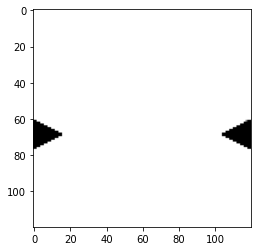

In [152]:
plt.imshow(np.flip(np.rot90(-gifsGIF[0]- anode_shape), axis=0), cmap='gray')

Text(0, 0.5, 'Fractal dimension')

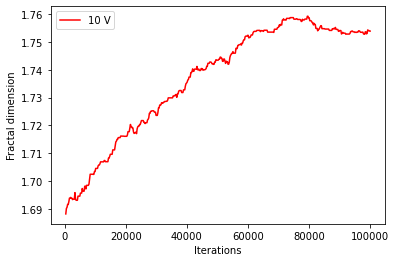

In [144]:
us = len(frac_dimsGIF)
xlin = np.linspace(400,us*200, us)
plt.plot(xlin, frac_dimsGIF, label= '10 V', c='r')
plt.legend()
plt.xlabel('Iterations')
plt.ylabel('Fractal dimension')

In [147]:
import os
import numpy as np
import matplotlib.pyplot as plt
import imageio

In [153]:
filenames = []
for i in range(0, len(gifsGIF)):
    # plot the line chart
    plt.imshow(np.flip(np.rot90(-gifsGIF[i]- anode_shape), axis=0), cmap='gray')
    
    # create file name and append it to a list
    filename = f'gifgif/{i}.png'
    filenames.append(filename)
    
    # save frame
    plt.savefig(filename)
    plt.close()
# build gif
with imageio.get_writer('mygif.gif', mode='I') as writer:
    for filename in filenames:
        image = imageio.imread(filename)
        writer.append_data(image)
        
# Remove files
for filename in set(filenames):
    os.remove(filename)

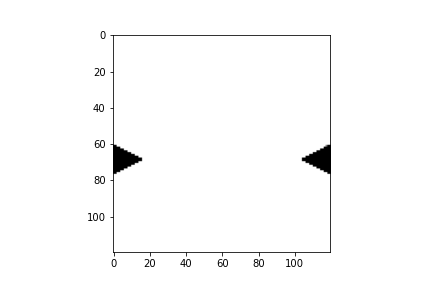

In [154]:
from IPython.display import display, Image
Image('mygif.gif')

250


Text(0, 0.5, 'Fractal dimension')

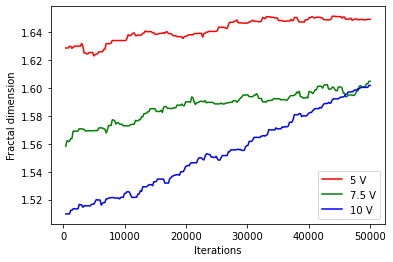

In [91]:
us = min(len(allFractalDimensions3[0]), len(allFractalDimensions3[1]), len(allFractalDimensions3[2])) -1
print(us)
xlin = np.linspace(400,us*200, us)
plt.plot(xlin, allFractalDimensions3[0][:us], label= '5 V', c='r')
plt.plot(xlin, allFractalDimensions3[1][:us], label='7.5 V' , c='g')
plt.plot(xlin, allFractalDimensions3[2][:us], label='10 V', c='b')
plt.legend()
plt.xlabel('Iterations')
plt.ylabel('Fractal dimension')

In [497]:
if __name__ == "__main__":
    t = LDA_PARAMETERS(x_len = x_len, y_len = y_len, 
                       anode_shape = anode_shape, 
                       starting_point = [a, b] , 
                       generation_point_check= 3, 
                       step_distribution= True,
                       epsilon_laplace= 1e-2,
                       eta_prob=15,
                       pre_matrix_dendrite = matrixDendriteK,
                       pre_solution_potential = potentialDendriteK,
                       verTrayectoria=True,
                       calculate_fd=200,
                       voltage = ivolt)
    matrixDendriteK, potentialDendriteK, frac_dimsK = t.on_execute()

Solving laplace equation... 
Iteration:  6400  - Error:  0.010051981574195255


In [111]:
pygame.quit()

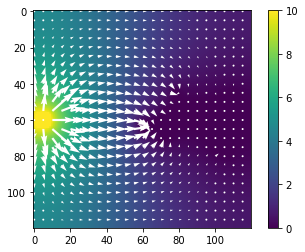

In [98]:
smth=np.linspace(0,allPotentialDendrite3[0].shape[0]-1, num=allPotentialDendrite3[0].shape[0])
smth = smth[::5]

dx, dy = np.gradient(np.flip(np.rot90(allPotentialDendrite3[2]), axis=0))
dx = dx[::5,::5]
dy = dy[::5,::5]
X,Y = np.meshgrid(smth, smth)
plt.imshow(np.flip(np.rot90(allPotentialDendrite3[2]), axis=0))
#plt.imshow(np.flip(np.rot90(allMatrixDendrite3[2]), axis=0), cmap='gray')

plt.colorbar()
plt.quiver(X,Y, -dy, dx,width=0.01,linewidth=0.1, color='white')
#plt.contour(np.rot90(potentialDendrite))
plt.show()

497


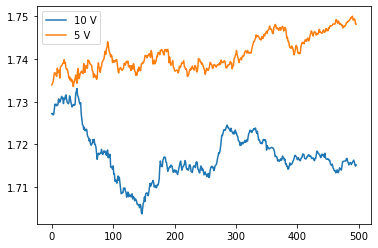

In [416]:
us = min(len(frac_dims), len(frac_dims2))
print(us)
plt.plot(frac_dims[:us], label= '10 V')
plt.plot(frac_dims2[:us], label='5 V')
plt.legend()

In [ ]:
x_len = 800      
y_len = 800    
anode_shape = np.zeros((x_len, y_len))


a = 100
b = 350
r = 20
x, y = np.ogrid[-a:x_len-a, -b:y_len-b]
mask = x*x + y*y <= r*r
anode_shape[mask] = 2


#LINEA RECTA!!
#anode_shape[440:445,:] = np.ones((5,anode_shape.shape[0]))

#CIRCULO!!
# aA = 400
# bA = 250
# rA = 20
# x, y = np.ogrid[-aA:x_len-aA, -bA:y_len-bA]
# mask = x*x + y*y <= r*r
# anode_shape[mask] = 1


#MEDIOCIRCULO!!
aA= 700
bA= 350
r = 20
x, y = np.ogrid[-aA:x_len-aA, -bA:y_len-bA]
mask = x*x + y*y <= r*r
anode_shape[mask] = 1


#Triangulo
# ladoTriang = x_len//10 +1
# for i in range(0, ladoTriang):
#     anode_shape[-1-i-1:-1, 300+i] = np.ones(1+i)
#     anode_shape[-1-i-1:-1, 300+2*ladoTriang-i-1] = np.ones(1+i)

# ladoTriang = x_len//5 +1
# for i in range(0, ladoTriang):
#     anode_shape[-1-i-1:-1, 230+i] = np.ones(1+i)
#     anode_shape[-1-i-1:-1, 230+2*ladoTriang-i-1] = np.ones(1+i)
    
    

#TRIANGULO PUNTIAGUDO
# ladoTriang = x_len//15 +1
# for i in range(0, ladoTriang):
#     anode_shape[-1-2*i-1:-1, 300+i] = np.ones(1+2*i)
#     anode_shape[-1-2*i-1:-1, 300+2*ladoTriang-i-1] = np.ones(1+2*i)

#     anode_shape[-1-2*i-1:-1, 320+i] = np.ones(1+2*i)
#     anode_shape[-1-2*i-1:-1, 320+2*ladoTriang-i-1] = np.ones(1+2*i)
    
#     anode_shape[-1-2*i-1:-1, 340+i] = np.ones(1+2*i)
#     anode_shape[-1-2*i-1:-1, 340+2*ladoTriang-i-1] = np.ones(1+2*i)
    
#     anode_shape[-1-2*i-1:-1, 360+i] = np.ones(1+2*i)
#     anode_shape[-1-2*i-1:-1, 360+2*ladoTriang-i-1] = np.ones(1+2*i)
    
#     anode_shape[-1-2*i-1:-1, 380+i] = np.ones(1+2*i)
#     anode_shape[-1-2*i-1:-1, 380+2*ladoTriang-i-1] = np.ones(1+2*i)
    
#     anode_shape[-1-2*i-1:-1, 400+i] = np.ones(1+2*i)
#     anode_shape[-1-2*i-1:-1, 400+2*ladoTriang-i-1] = np.ones(1+2*i)
    
    
    
if __name__ == "__main__":
    t = LDA_PARAMETERS(x_len = x_len, y_len = y_len, 
                       anode_shape = anode_shape, 
                       starting_point = [a, b] , 
                       generation_point_check= 2, 
                       step_distribution= False )
    matrixDendrite, potentialDendrite = t.on_execute()

In [151]:
x_len = 400      
y_len = 400    
anode_shape = np.zeros((x_len, y_len))


a = 100
b = 350
r = 20
x, y = np.ogrid[-a:x_len-a, -b:y_len-b]
mask = x*x + y*y <= r*r
anode_shape[mask] = 2


#LINEA RECTA!!
#anode_shape[440:445,:] = np.ones((5,anode_shape.shape[0]))

#CIRCULO!!
# aA = 400
# bA = 250
# rA = 20
# x, y = np.ogrid[-aA:x_len-aA, -bA:y_len-bA]
# mask = x*x + y*y <= r*r
# anode_shape[mask] = 1


aA= 300
bA= 350
r = 20
x, y = np.ogrid[-aA:x_len-aA, -bA:y_len-bA]
mask = x*x + y*y <= r*r
anode_shape[mask] = 1

    
if __name__ == "__main__":
    t = LDA_PARAMETERS(x_len = x_len, y_len = y_len, 
                       anode_shape = anode_shape, 
                       starting_point = [a, b] , 
                       generation_point_check= 2, 
                       step_distribution= False,
                       epsilon_laplace= 1e-1,
                       eta_prob=2,
                       pre_solution_potential = None,
                       verTrayectoria=False)
    matrixDendrite, potentialDendrite = t.on_execute()

IndexError: boolean index did not match indexed array along dimension 0; dimension is 120 but corresponding boolean dimension is 400

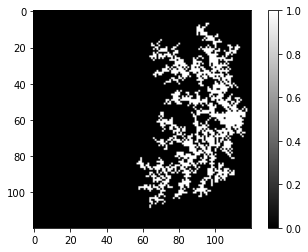

In [338]:
plt.imshow(np.rot90(matrixDendrite), cmap='gray')
plt.colorbar()

In [349]:
def exporting_to_mathematica(matrixDend, anode_shap):
    maskedDendrite= np.zeros_like(matrixDend)
    matrixDend=matrixDend/np.max(matrixDend)
    matrixDend = matrixDend.astype(int) - anode_shap.astype(int)
    maskedDendrite[matrixDend>0]=1
    return maskedDendrite

def saving_to_mathematica(maskedDendr, name='trial'):
    maskedDendr = maskedDendr.flatten()
    maskedDendr.astype('float32').tofile(f'{name}.dat')

In [343]:
maskedDendrite = exporting_to_mathematica(matrixDendrite, anode_shape)
saving_to_mathematica(maskedDendrite)
subprocess.call(["WolframScript", "-run", "fracDim_llamar_python.m"])
f = open("fractal_dim_value.txt", "r")
dim = f.read()
dim = float(dim)
f.close()

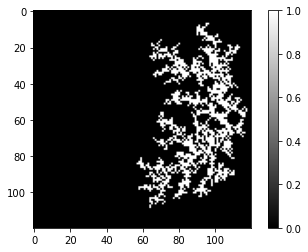

In [344]:
plt.imshow(np.rot90(maskedDendrite), cmap='gray')
plt.colorbar()

In [427]:
xxx = [1,3,4,7,7,5,6]


In [428]:
y.append(xxx)

In [429]:
y

[[1, 3, 7, 7, 7, 7, 5, 6], [1, 3, 4, 7, 7, 5, 6]]

In [167]:
potentialDendrite
def try1(x,y,eta, potentialDendrite):
    potentialDendrite = np.rot90(potentialDendrite)
    radi = potentialDendrite[x-1:x+2,y-1:y+2]
    electric_field = radi - (potentialDendrite[x,y])*np.ones_like(radi)
    electric_field[0,0]/=np.sqrt(2)
    electric_field[0,2]/=np.sqrt(2)
    electric_field[2,2]/=np.sqrt(2)
    electric_field[2,0]/=np.sqrt(2)

    
    electric_field = np.exp(-eta*electric_field)
    electric_field[1,1]=0

#     electric_field = electric_field**eta
    prob = electric_field/np.sum(electric_field)
    probs_to_walk = prob.flatten()
    print(prob)
#     except:
#         probs_to_walk = np.ones(9)/9
    return probs_to_walk

In [137]:
try1(60,60,10)[8]
walks[np.random.choice(len(walks), p = try1(60,60,50))]

[[0.05347277 0.05342962 0.05337393]
 [0.10582742 0.         0.10563879]
 [0.20956441 0.20948893 0.20920413]]
[[0.00035367 0.00035225 0.00035042]
 [0.01073817 0.         0.0106428 ]
 [0.3269841  0.32639562 0.32418298]]


(1, -1)

In [140]:
dx,dy= walks[np.random.choice(len(walks), p = try1(60,60,50))]
print(dx,dy)
5+dy

[[0.00035367 0.00035225 0.00035042]
 [0.01073817 0.         0.0106428 ]
 [0.3269841  0.32639562 0.32418298]]
0 -1


4

In [169]:
im = np.copy(potentialDendrite)
x,y = 60, 60

for i in range(1000):
    im[(x,y)] = 11
    
    dx,dy = walks[np.random.choice(len(walks), p = try1(x,y,40, potentialDendrite))]
    x+=dx
    y+=dy
    clear_output(wait=True)
    plt.imshow(np.rot90(im), cmap='gray')
    plt.xlabel('x')
    plt.ylabel('y')
    plt.show()
    print(x,y)




KeyboardInterrupt: 

In [ ]:
x = np.ones((5,5)) -2*np.ones((5,5))

In [ ]:
np.sum(np.abs(x))

In [ ]:
xxx= np.array([[1,2,3],[2,1,2]])
xxx.shape

In [ ]:
np.zeros((xxx.shape[0]+1, xxx.shape[1]+1)).shape

In [ ]:
xxx = np.arange(9).reshape(3,3)
xxx

In [ ]:
xxx.flatten()

In [ ]:
xxx[:,1]

In [ ]:
np.array([1,2,3,4])**3

In [ ]:
# walks = ((0,1), (0,-1), (1,0),(1,0), (-1,0), (1,-1),(-1,1), (1,1), (-1,-1) )

# def maxwellBoltzman(m=1, s=1, T=1 ):
#     kbol= 8.6173*10e-5 #eV/K
#     prob = (m*s/(kbol*T))*np.exp(-m*s**2 / (2*kbol*T))
#     return prob
    
# # T=298.15 K <= 25 grados C
# # m = 136.286 g/mol del cloruro de zinc

# plt.plot(np.arange(100), maxwellBoltzman(s = np.arange(100), T=298.15))

In [ ]:
#walks = [(0,1), (0,-1), (1,0), (-1,0), (1,-1),(-1,1), (1,1), (-1,-1), (1,0)]

# class LDA:
#     def __init__(self):
#         self.size = self.width, self.height = 540, 480
        
#         self.startX, self.startY = round(self.width/2), round(self.height/2)
#         self.X, self.Y = self.startX, self.startY
        
        
#         self.minX, self.minY = self.X, self.Y
#         self.maxX, self.maxY = self.X, self.Y
#         self.padSize = 20
        
#         self.domainMinX = self.startX - self.padSize
#         self.domainMaxX = self.startX + self.padSize
#         self.domainMinY = self.startY - self.padSize
#         self.domainMaxY = self.startY + self.padSize
        
#         self.crystalColour = 0xFFFFFF
        
#         self.displaySurface = None
#         self.pixelArray = None
#         self.updateFlag = False
        
        
#     def on_init(self):
#         pygame.init()
#         pygame.display.set_caption("IPT")
#         self.displaySurface = pygame.display.set_mode(self.size)
#         self.pixelArray = pygame.PixelArray(self.displaySurface)
#         self.isRunning = True
        
        
#         self.pixelArray[self.startX, self.startY+10] = self.crystalColour
#         pygame.display.update()
        
#     def on_event(self, event):
#         if event.type == pygame.QUIT:
#             self.isRunning = False
    
#     def on_loop(self):
        
#         newDir = random.choice(walks)
#         dX, dY = newDir
        
#         newX, newY = self.X+dX, self.Y+dY
        
        
#         if (newX<self.domainMinX):
#             newX = self.domainMaxX     
#         if (newX > self.domainMaxX):
#             newX = self.domainMinX       
#         if(newY<self.domainMinY):
#             newY = self.domainMaxY 
#         if(newY > self.domainMaxY):
#             newY = self.domainMinY
        
        
#         if (self.pixelArray[newX, newY]) == self.crystalColour:
#             self.updateFlag = True
            
#             if (self.X < self.minX):
#                 self.minX = self.X
                
#             if (self.X > self.maxX):
#                 self.maxX = self.X
            
#             if (self.Y < self.minY):
#                 self.minY = self.Y
                
#             if (self.Y > self.maxY):
#                 self.maxY = self.Y
            
#             self.domainMinX = max([self.minX - self.padSize,1])
#             self.domainMaxX = max([self.maxX + self.padSize, self.width - 1])
#             self.domainMinY = max([self.minY - self.padSize,1])
#             self.domainMaxY = max([self.maxY + self.padSize, self.height - 1])
                
            
#         else:
#             self.updateFlag = False
#             self.X , self.Y = newX, newY
            
        
        
#     def on_render(self):
        
#         if self.updateFlag:
#             self.pixelArray[self.X, self.Y] = self.crystalColour
#             pygame.display.update()
            
#             self.updateFlag = False
            
#             newSide = random.choice([1,2,3,4])
            
#             if(newSide == 1):
#                 self.X = self.domainMinX
#                 self.Y = int(random.uniform(self.domainMinY, self.domainMaxY))
                
#             elif(newSide == 2):
#                 self.X = int(random.uniform(self.domainMinX, self.domainMaxX))
#                 self.Y = self.domainMinY

#             elif(newSide == 3):
#                 self.X = self.domainMaxX
#                 self.Y = int(random.uniform(self.domainMinY, self.domainMaxY))
            
#             else:
#                 self.X = int(random.uniform(self.domainMinX, self.domainMaxX))
#                 self.Y = self.domainMaxY
                 
#     def on_execute(self):
#         if self.on_init() == False:
#             self.isRunning = False
        
#         while self.isRunning:
#             for event in pygame.event.get():
#                 self.on_event(event)
                
#             self.on_loop()
#             self.on_render()
            
#         pygame.quit()
        


In [ ]:
        
# if __name__ == "__main__":
#     t = LDA()
#     t.on_execute()

In [14]:
xxx =np.array([[1,2,3], [4,5,6], [7,8,9]])
xxx

array([[1, 2, 3],
       [4, 5, 6],
       [7, 8, 9]])

In [25]:
xxx[0,2]

3

In [11]:
xxx = xxx.flatten()

In [13]:
xxx[1]

2

In [ ]:
walks = [(-1,-1) , (-1,0) , (-1,1), 
         (0,-1) , (0,0) , (0,1),
         (1,-1), (1,0), (1,1)]